<a href="https://colab.research.google.com/github/SoderstromJohnR/CS4300Final/blob/master/Final_Project_CS4300.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project

The dataset is formed from 16 years of professional tennis match data (2000-2015). There were two additional years, but they did not match the same format when imported for some reason. There are already over 40000 rows without the additional data, providing plenty of material to work with without the extra years.

Original source: https://www.kaggle.com/gmadevs/atp-matches-dataset

# Data Preparation - Part 1

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from google.colab import files
files.upload()

Saving atp_matches_2000.csv to atp_matches_2000.csv
Saving atp_matches_2001.csv to atp_matches_2001.csv
Saving atp_matches_2002.csv to atp_matches_2002.csv
Saving atp_matches_2003.csv to atp_matches_2003.csv
Saving atp_matches_2004.csv to atp_matches_2004.csv
Saving atp_matches_2005.csv to atp_matches_2005.csv
Saving atp_matches_2006.csv to atp_matches_2006.csv
Saving atp_matches_2007.csv to atp_matches_2007.csv
Saving atp_matches_2008.csv to atp_matches_2008.csv
Saving atp_matches_2009.csv to atp_matches_2009.csv
Saving atp_matches_2010.csv to atp_matches_2010.csv
Saving atp_matches_2011.csv to atp_matches_2011.csv
Saving atp_matches_2012.csv to atp_matches_2012.csv
Saving atp_matches_2013.csv to atp_matches_2013.csv
Saving atp_matches_2014.csv to atp_matches_2014.csv
Saving atp_matches_2015.csv to atp_matches_2015.csv


{'atp_matches_2000.csv': b"tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,winner_rank,winner_rank_points,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,loser_rank,loser_rank_points,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced\n2000-717,Orlando,Clay,32,A,20000501,001,102179,,,Antony Dupuis,R,185,FRA,27.1813826146,113,351,102776,1,,Andrew Ilie,R,180,AUS,24.0355920602,50,762,3-6 7-6(6) 7-6(4),3,R32,162,8,1,126,76,56,29,16,14,15,13,4,110,59,49,31,17,4,4\n2000-717,Orlando,Clay,32,A,20000501,002,103602,,Q,Fernando Gonzalez,R,183,CHI,19.7563312799,352,76,102821,,WC,Cecil Mamiit,R,173,PHI,23.8439425051,139,280,6-2 7-5,3,R32,86,4,2,67,35,25,16,10,4,6,0,0,57,24,13,17,10,4,9\n2000-717,Orlando,Clay,32,A,20000501,003,

Merge data from all years and reset the indices to avoid repeats.

In [3]:
# Data also existed for 2016 and 2017, but missed several values and were not reading properly into the dataframe
# 16 years of data still provides a great deal of information
dfList = []
dfList.append(pd.read_csv('atp_matches_2000.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2001.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2002.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2003.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2004.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2005.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2006.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2007.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2008.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2009.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2010.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2011.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2012.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2013.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2014.csv', delimiter=','))
dfList.append(pd.read_csv('atp_matches_2015.csv', delimiter=','))
dataOrig = pd.concat(dfList)

# Reapply indices after concatenation, they were repeating
dataOrig.reset_index(inplace=True, drop=True) 
dataOrig.tail()

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,winner_rank,winner_rank_points,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,loser_rank,loser_rank_points,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced
50174,2015-D080,Davis Cup WG PO: BRA vs CRO,Clay,4,D,20150918,3,106432,NaN,NaN,Borna Coric,R,NaN,CRO,18.830938,33.0,1161.0,105064,NaN,NaN,Thomaz Bellucci,L,188.0,BRA,27.707050,30.0,1235.0,6-2 4-6 7-6(4) 4-0,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50175,2015-D081,Davis Cup WG PO: POL vs SVK,Hard,4,D,20150918,1,105373,NaN,NaN,Martin Klizan,L,190.0,SVK,26.176591,36.0,1125.0,104308,NaN,NaN,Michal Przysiezny,R,185.0,POL,31.575633,143.0,382.0,6-4 6-4 6-4,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50176,2015-D081,Davis Cup WG PO: POL vs SVK,Hard,4,D,20150918,2,105668,NaN,NaN,Jerzy Janowicz,R,203.0,POL,24.835044,61.0,755.0,105613,NaN,NaN,Norbert Gombos,R,NaN,SVK,25.086927,121.0,452.0,7-6(1) 6-4 6-7(5) 6-2,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50177,2015-D081,Davis Cup WG PO: POL vs SVK,Hard,4,D,20150918,3,105373,NaN,NaN,Martin Klizan,L,190.0,SVK,26.176591,36.0,1125.0,105668,NaN,NaN,Jerzy Janowicz,R,203.0,POL,24.835044,61.0,755.0,6-3 7-6(4) 6-3,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50178,2015-D081,Davis Cup WG PO: POL vs SVK,Hard,4,D,20150918,4,104308,NaN,NaN,Michal Przysiezny,R,185.0,POL,31.575633,143.0,382.0,105613,NaN,NaN,Norbert Gombos,R,NaN,SVK,25.086927,121.0,452.0,6-3 6-4 6-4,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Process the original database, removing rows with missing values and manipulating columns to separate data for easier evaluation. The number of rows will drop about 10000, but missing values would impact the model and we're left with a substantial number afterward (about 40000 compared to 50000).

In [4]:
# Drop 4 unnecessary columns (seeds do not necessarily give us useful information and may be redundant with rank) and missing values
dataRm = dataOrig.drop(axis=1, columns=['winner_seed', 'winner_entry', 'loser_seed', 'loser_entry'])
dataRm = dataRm.dropna()

# Replace the tournament date column with two more containing years and months respectively
dataRm.insert(1, "year", ((dataRm['tourney_date'] / 10000).astype('int64')), True)
dataRm.insert(2, "month", ((dataRm['tourney_date'] / 100).astype('int64') % 100), True)
dataRm = dataRm.drop(axis=1, columns=['tourney_date'])

# Reset indices on new dataframe that dropped rows missing values.
dataRm.reset_index(inplace=True, drop=True)
dataRm

,tourney_id,year,month,tourney_name,surface,draw_size,tourney_level,match_num,winner_id,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,winner_rank,winner_rank_points,loser_id,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,loser_rank,loser_rank_points,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced
0,2000-717,2000,5,Orlando,Clay,32,A,1,102179,Antony Dupuis,R,185.0,FRA,27.181383,113.0,351.0,102776,Andrew Ilie,R,180.0,AUS,24.035592,50.0,762.0,3-6 7-6(6) 7-6(4),3,R32,162.0,8.0,1.0,126.0,76.0,56.0,29.0,16.0,14.0,15.0,13.0,4.0,110.0,59.0,49.0,31.0,17.0,4.0,4.0
1,2000-717,2000,5,Orlando,Clay,32,A,2,103602,Fernando Gonzalez,R,183.0,CHI,19.756331,352.0,76.0,102821,Cecil Mamiit,R,173.0,PHI,23.843943,139.0,280.0,6-2 7-5,3,R32,86.0,4.0,2.0,67.0,35.0,25.0,16.0,10.0,4.0,6.0,0.0,0.0,57.0,24.0,13.0,17.0,10.0,4.0,9.0
2,2000-717,2000,5,Orlando,Clay,32,A,3,103387,Paradorn Srichaphan,R,185.0,THA,20.881588,103.0,380.0,102205,Sebastien Lareau,R,183.0,CAN,27.011636,133.0,293.0,6-1 6-3,3,R32,64.0,4.0,1.0,46.0,29.0,23.0,11.0,8.0,0.0,0.0,2.0,2.0,65.0,39.0,22.0,10.0,8.0,6.0,10.0
3,2000-717,2000,5,Orlando,Clay,32,A,4,101733,Jan Siemerink,L,183.0,NED,30.047912,107.0,371.0,102925,Justin Gimelstob,R,196.0,USA,23.260780,95.0,408.0,4-6 6-2 7-5,3,R32,150.0,8.0,6.0,109.0,56.0,43.0,21.0,15.0,9.0,12.0,4.0,6.0,104.0,57.0,35.0,24.0,15.0,6.0,11.0
4,2000-717,2000,5,Orlando,Clay,32,A,5,101727,Jason Stoltenberg,R,185.0,AUS,30.075291,74.0,543.0,101826,Alex Lopez Moron,R,175.0,ESP,29.423682,111.0,357.0,6-1 6-4,3,R32,60.0,3.0,0.0,50.0,27.0,22.0,16.0,9.0,1.0,1.0,0.0,3.0,47.0,28.0,17.0,10.0,8.0,3.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40408,2015-520,2015,5,Roland Garros,Clay,128,G,123,104542,Jo Wilfried Tsonga,R,188.0,FRA,30.102669,15.0,2045.0,105453,Kei Nishikori,R,178.0,JPN,25.401780,5.0,5220.0,6-1 6-4 4-6 3-6 6-3,5,QF,225.0,10.0,1.0,118.0,72.0,60.0,23.0,23.0,3.0,7.0,5.0,6.0,160.0,106.0,71.0,23.0,22.0,13.0,19.0
40409,2015-520,2015,5,Roland Garros,Clay,128,G,124,104527,Stanislas Wawrinka,R,183.0,SUI,30.157426,9.0,3845.0,103819,Roger Federer,R,185.0,SUI,33.793292,2.0,9235.0,6-4 6-3 7-6(4),5,QF,129.0,4.0,0.0,92.0,50.0,44.0,26.0,15.0,4.0,4.0,7.0,0.0,112.0,71.0,48.0,23.0,16.0,5.0,8.0
40410,2015-520,2015,5,Roland Garros,Clay,128,G,125,104925,Novak Djokovic,R,188.0,SRB,28.008214,1.0,13845.0,104918,Andy Murray,R,190.0,GBR,28.027379,3.0,7040.0,6-3 6-3 5-7 5-7 6-1,5,SF,249.0,8.0,2.0,141.0,98.0,67.0,29.0,25.0,1.0,4.0,12.0,1.0,149.0,98.0,63.0,28.0,24.0,13.0,19.0
40411,2015-520,2015,5,Roland Garros,Clay,128,G,126,104527,Stanislas Wawrinka,R,183.0,SUI,30.157426,9.0,3845.0,104542,Jo Wilfried Tsonga,R,188.0,FRA,30.102669,15.0,2045.0,6-3 6-7(1) 7-6(3) 6-4,5,SF,226.0,15.0,6.0,157.0,82.0,62.0,44.0,22.0,16.0,17.0,8.0,2.0,147.0,102.0,73.0,25.0,21.0,12.0,15.0


# Data Preparation - Part 2

Move data into a new data frame and replace text values in categorical attributes with numeric values.

In [0]:
# Insert columns as necessary (as copies) into the new data frame
#dataRep = dataRm[['year', 'month', 'draw_size', 'minutes']].copy()
# Removing some columns that had limited impact from the feature removal activity
dataRep = pd.DataFrame()
# Set numeric values for match surfaces, roughly by surface hardness
#   1 = Carpet
#   2 = Grass
#   3 = Clay
#   4 = Hard
surfCond = [(dataRm['surface'] == 'Carpet'), 
            (dataRm['surface'] == 'Grass'), 
            (dataRm['surface'] == 'Clay'),
            (dataRm['surface'] == 'Hard')]
surfChoice = [1, 2, 3, 4] 
dataRep['surface'] = np.select(surfCond, surfChoice)

# Set numeric values for tournament level - setting names by what is shown from kaggle, still doublechecking that they are listed properly
#   1 = A / Tour Series?
#   2 = G / Grand Slam?
#   3 = M / Masters?
#   4 = F / Finals?
#   5 = C / Challengers?
levelCond = [(dataRm['tourney_level'] == 'A'), 
             (dataRm['tourney_level'] == 'G'), 
             (dataRm['tourney_level'] == 'M'),
             (dataRm['tourney_level'] == 'F'),
             (dataRm['tourney_level'] == 'C')]
levelChoice = [1, 2, 3, 4, 5] 
dataRep['tourney_level'] = np.select(levelCond, levelChoice)

# Removing the 'round' column, which appeared to have minimal impact. From a theoretical standpoint, it had limited impact where matches closer to finals may have had more even players or possibly more tired players.
## Set numeric values for round of tournament, R64/R128/RR will not be present in all of them
##   1 = F / Finals
##   2 = SF / Semifinals
##   3 = QF / Quarterfinals
##   4 = R16 / 16 player round
##   5 = R32 / 32 player round
##   6 = R64 / 64 player round
##   7 = R128 / 128 player round
##   8 = RR / Round robin
#roundCond = [(dataRm['round'] == 'F'), 
#             (dataRm['round'] == 'SF'), 
#             (dataRm['round'] == 'QF'),
#             (dataRm['round'] == 'R16'),
#             (dataRm['round'] == 'R32'),
#             (dataRm['round'] == 'R64'),
#             (dataRm['round'] == 'R128'),
#             (dataRm['round'] == 'RR')]
#roundChoice = [1, 2, 3, 4, 5, 6, 7, 8] 
#dataRep['round'] = np.select(roundCond, roundChoice)

# Removing for limited impact on the model.
#dataRep['num_sets'] = dataRm['best_of']

# Seemed to have limited impact, but is one of the few details we know before a match is finished and may have real influence on the result.
handCond = [(dataRm['winner_hand'] == 'L'),
            (dataRm['winner_hand'] == 'R')]
handChoice = [0, 1]
dataRep['p1_hand'] = np.select(handCond, handChoice)
handCond = [(dataRm['loser_hand'] == 'L'),
            (dataRm['loser_hand'] == 'R')]
dataRep['p2_hand'] = np.select(handCond, handChoice)

# Maintaining all of these columns even when they had minimal impact from feature selection. 
dataRep['p1_height'] = dataRm['winner_ht']
dataRep['p2_height'] = dataRm['loser_ht']
dataRep['p1_age'] = dataRm['winner_age']
dataRep['p2_age'] = dataRm['loser_age']
dataRep['p1_rank'] = dataRm['winner_rank']
dataRep['p2_rank'] = dataRm['loser_rank']
dataRep['p1_rank_points'] = dataRm['winner_rank_points']
dataRep['p2_rank_points'] = dataRm['loser_rank_points']
dataRep['p1_aces'] = dataRm['w_ace']
dataRep['p2_aces'] = dataRm['l_ace']
dataRep['p1_double_fault'] = dataRm['w_df']
dataRep['p2_double_fault'] = dataRm['l_df']
dataRep['p1_service_games'] = dataRm['w_SvGms']
dataRep['p2_service_games'] = dataRm['l_SvGms']
dataRep['p1_service_points'] = dataRm['w_svpt']
dataRep['p2_service_points'] = dataRm['l_svpt']
dataRep['p1_first_serve_in'] = dataRm['w_1stIn']
dataRep['p2_first_serve_in'] = dataRm['l_1stIn']
dataRep['p1_first_serve_won'] = dataRm['w_1stWon']
dataRep['p2_first_serve_won'] = dataRm['l_1stWon']
dataRep['p1_second_serve_won'] = dataRm['w_2ndWon']
dataRep['p2_second_serve_won'] = dataRm['l_2ndWon']
dataRep['p1_break_points_saved'] = dataRm['w_bpSaved']
dataRep['p2_break_points_saved'] = dataRm['l_bpSaved']
dataRep['p1_break_points_faced'] = dataRm['w_bpFaced']
dataRep['p2_break_points_faced'] = dataRm['l_bpFaced']
# Adds the output, which will be altered to 0 for rows that are reversed.
dataRep['winner_first_player'] = 1

Reverse data for half the rows. This way, the first player in each row will not always be the winner, and the output will not always be a 1. The model should try to predict the winning player based on the input for each of them, not merely by who was entered first.

With the additional column removals above, the number of inputs is down from 36 to 30.

In [6]:
reverseData = dataRep.sample(int(len(dataRep.index) / 2)).index
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_hand':'p2_hand','p2_hand':'p1_hand'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_height':'p2_height','p2_height':'p1_height'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_age':'p2_age','p2_age':'p1_age'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_rank':'p2_rank','p2_rank':'p1_rank'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_rank_points':'p2_rank_points','p2_rank_points':'p1_rank_points'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_aces':'p2_aces','p2_aces':'p1_aces'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_double_fault':'p2_double_fault','p2_double_fault':'p1_double_fault'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_service_games':'p2_service_games','p2_service_games':'p1_service_games'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_service_points':'p2_service_points','p2_service_points':'p1_service_points'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_first_serve_in':'p2_first_serve_in','p2_first_serve_in':'p1_first_serve_in'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_first_serve_won':'p2_first_serve_won','p2_first_serve_won':'p1_first_serve_won'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_second_serve_won':'p2_second_serve_won','p2_second_serve_won':'p1_second_serve_won'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_break_points_saved':'p2_break_points_saved','p2_break_points_saved':'p1_break_points_saved'})
dataRep.loc[reverseData] = dataRep.loc[reverseData].rename(columns={'p1_break_points_faced':'p2_break_points_faced','p2_break_points_faced':'p1_break_points_faced'})
dataRep.loc[reverseData, 'winner_first_player'] = 0
dataRep.shape

(40413, 31)

Add a second dataframe that removes data known only after a match.

In [7]:
dataRepEarly = dataRep.iloc[:, :dataRep.columns.get_loc('p1_aces')]
dataRepEarly['winner_first_player'] = dataRep['winner_first_player']
dataRep.columns

Index(['surface', 'tourney_level', 'p1_hand', 'p2_hand', 'p1_height',
       'p2_height', 'p1_age', 'p2_age', 'p1_rank', 'p2_rank', 'p1_rank_points',
       'p2_rank_points', 'p1_aces', 'p2_aces', 'p1_double_fault',
       'p2_double_fault', 'p1_service_games', 'p2_service_games',
       'p1_service_points', 'p2_service_points', 'p1_first_serve_in',
       'p2_first_serve_in', 'p1_first_serve_won', 'p2_first_serve_won',
       'p1_second_serve_won', 'p2_second_serve_won', 'p1_break_points_saved',
       'p2_break_points_saved', 'p1_break_points_faced',
       'p2_break_points_faced', 'winner_first_player'],
      dtype='object')

Create a numpy array from the data frame for modeling.

In [8]:
dataModel = dataRep.to_numpy()
dataModelEarly = dataRepEarly.to_numpy()
dataModel.shape

(40413, 31)

Shuffle the data so it isn't focused by year or other attributes.

In [0]:
import random
np.random.shuffle(dataModel)
np.random.shuffle(dataModelEarly)

Split and normalize data for modeling. Currently splits into a 70/30 ratio.

In [0]:
# Get number of columns and subtract one for indices, in case of other changes
outCol = len(dataModel[0]) - 1
# Index for 30%
index_30percent = int(0.3 * len(dataModel[:, 0]))
# Split into training and validation
XVALID = dataModel[:index_30percent, :outCol].copy()
YVALID = dataModel[:index_30percent, outCol].copy()
XTRAIN = dataModel[index_30percent:, :outCol].copy()
YTRAIN = dataModel[index_30percent:, outCol].copy()
# Repeat for the extra dataset
outColEarly = len(dataModelEarly[0]) - 1
XVALIDearly = dataModelEarly[:index_30percent, :outColEarly].copy()
YVALIDearly = dataModelEarly[:index_30percent, outColEarly].copy()
XTRAINearly = dataModelEarly[index_30percent:, :outColEarly].copy()
YTRAINearly = dataModelEarly[index_30percent:, outColEarly].copy()

In [0]:
# Standardization
mean = XTRAIN.mean(axis = 0)
XTRAIN -= mean
std = XTRAIN.std(axis = 0)
XTRAIN /= std
XVALID -= mean
XVALID /= std
# Repeat for extra dataset (different shape means we can't just use the same mean/std)
meanEarly = XTRAINearly.mean(axis = 0)
XTRAINearly -= meanEarly
stdEarly = XTRAINearly.std(axis = 0)
XTRAINearly /= stdEarly
XVALIDearly -= meanEarly
XVALIDearly /= stdEarly

Check the division of outputs after randomly dividing data into training and validation. They are nearly perfectly divided.

In [12]:
unique, counts = np.unique(YTRAIN, return_counts=True)
print(np.asarray((unique.astype(int), counts.astype(int))).T)

[[    0 14195]
 [    1 14095]]


# Models

Starting with the basic perceptron, since that seemed to work best with what I tried initially. As I get further in setting up this report I will continue testing larger models.

In [0]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

Basic model with all inputs.

In [14]:
callback_a = ModelCheckpoint(filepath = 'modelMain.hdf5', monitor = 'val_accuracy', save_best_only = True, save_weights_only = True, verbose = 1)
callback_b = EarlyStopping(monitor = 'val_accuracy', mode = 'max' , patience = 50, verbose = 1)

modelMain = Sequential()
modelMain.add(Dense(1, input_dim = outCol, activation='sigmoid'))
modelMain.compile(loss='binary_crossentropy', optimizer = 'rmsprop', metrics=['accuracy'])
historyMain = modelMain.fit(XTRAIN, YTRAIN, validation_data=(XVALID, YVALID), epochs = 1000, verbose = 1, callbacks = [callback_a, callback_b])
modelMain.load_weights('modelMain.hdf5')

Epoch 1/1000
871/885 [============================>.] - ETA: 0s - loss: 0.5681 - accuracy: 0.7071
Epoch 00001: val_accuracy improved from -inf to 0.84591, saving model to modelMain.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.5657 - accuracy: 0.7090 - val_loss: 0.4010 - val_accuracy: 0.8459
Epoch 2/1000
884/885 [============================>.] - ETA: 0s - loss: 0.3439 - accuracy: 0.8763
Epoch 00002: val_accuracy improved from 0.84591 to 0.89516, saving model to modelMain.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.3439 - accuracy: 0.8763 - val_loss: 0.3031 - val_accuracy: 0.8952
Epoch 3/1000
881/885 [============================>.] - ETA: 0s - loss: 0.2761 - accuracy: 0.9080
Epoch 00003: val_accuracy improved from 0.89516 to 0.91528, saving model to modelMain.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.2760 - accuracy: 0.9080 - val_loss: 0.2567 - val_accuracy: 0.9153
Epoch 4/1000
868/885 [=====================

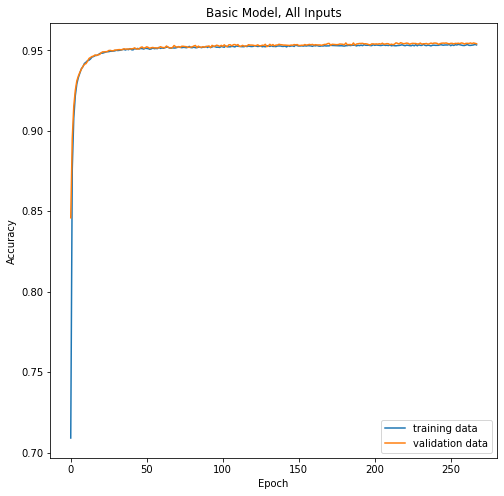

In [15]:
# Plot the learning curves (loss/accuracy/MAE)
plt.figure(figsize=(8,8))
plt.plot(historyMain.history['accuracy']) # replace with accuracy/MAE
plt.plot(historyMain.history['val_accuracy']) # replace with val_accuracy, etc.
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.title('Basic Model, All Inputs')
plt.legend(['training data', 'validation data'], loc='lower right')
plt.savefig('BMAllIn.png')
plt.show()
files.download('BMAllIn.png')

In [41]:
predictionMainTrain = modelMain.predict(XTRAIN)
predictionMain = modelMain.predict(XVALID)
print("Training Accuracy: {:.2f}%".format(accuracy_score(YTRAIN, predictionMainTrain.round()) * 100))
print("Validation Accuracy: {:.2f}%".format(accuracy_score(YVALID, predictionMain.round()) * 100))

Training Accuracy: 95.31%
Validation Accuracy: 95.47%


Run a model with the same structure on the extra dataset (including only information known before the match starts).

In [21]:
callback_a_early = ModelCheckpoint(filepath = 'modelEarly.hdf5', monitor = 'val_accuracy', save_best_only = True, save_weights_only = True, verbose = 1)
callback_b_early = EarlyStopping(monitor = 'val_accuracy', mode = 'max' , patience = 50, verbose = 1)

modelEarly = Sequential()
modelEarly.add(Dense(1, input_dim = outColEarly, activation='sigmoid'))
modelEarly.compile(loss='binary_crossentropy', optimizer = 'rmsprop', metrics=['accuracy'])
historyEarly = modelEarly.fit(XTRAINearly, YTRAINearly, validation_data=(XVALIDearly, YVALIDearly), epochs = 1000, verbose = 1, callbacks = [callback_a_early, callback_b_early])
modelEarly.load_weights('modelEarly.hdf5')

Epoch 1/1000
882/885 [============================>.] - ETA: 0s - loss: 0.6709 - accuracy: 0.5924
Epoch 00001: val_accuracy improved from -inf to 0.64505, saving model to modelEarly.hdf5
885/885 [==============================] - 2s 2ms/step - loss: 0.6708 - accuracy: 0.5924 - val_loss: 0.6268 - val_accuracy: 0.6451
Epoch 2/1000
867/885 [============================>.] - ETA: 0s - loss: 0.6217 - accuracy: 0.6546
Epoch 00002: val_accuracy improved from 0.64505 to 0.64629, saving model to modelEarly.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.6211 - accuracy: 0.6552 - val_loss: 0.6244 - val_accuracy: 0.6463
Epoch 3/1000
865/885 [============================>.] - ETA: 0s - loss: 0.6204 - accuracy: 0.6541
Epoch 00003: val_accuracy improved from 0.64629 to 0.64753, saving model to modelEarly.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.6204 - accuracy: 0.6545 - val_loss: 0.6245 - val_accuracy: 0.6475
Epoch 4/1000
866/885 [==================

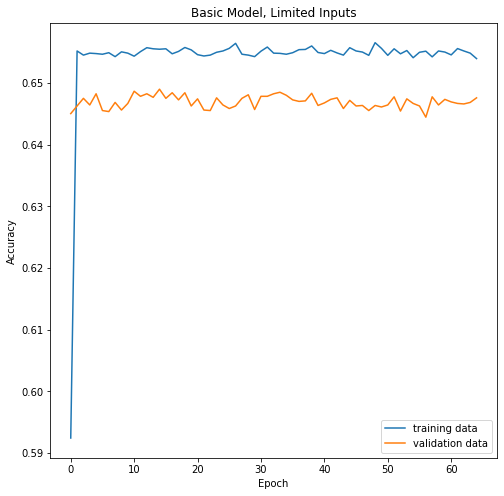

In [22]:
# Plot the learning curves (loss/accuracy/MAE)
plt.figure(figsize=(8,8))
plt.plot(historyEarly.history['accuracy']) # replace with accuracy/MAE
plt.plot(historyEarly.history['val_accuracy']) # replace with val_accuracy, etc.
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.title('Basic Model, Limited Inputs')
plt.legend(['training data', 'validation data'], loc='lower right')
plt.savefig('BMLimIn.png')
plt.show()
files.download('BMLimIn.png')

In [42]:
predictionEarlyTrain = modelEarly.predict(XTRAINearly)
predictionEarly = modelEarly.predict(XVALIDearly)
print("Training Accuracy: {:.2f}%".format(accuracy_score(YTRAINearly, predictionEarlyTrain.round()) * 100))
print("Validation Accuracy: {:.2f}%".format(accuracy_score(YVALIDearly, predictionEarly.round()) * 100))

Training Accuracy: 65.59%
Validation Accuracy: 64.90%


Model with all inputs and slight added complexity.

In [27]:
callback_a2 = ModelCheckpoint(filepath = 'modelMainTwo.hdf5', monitor = 'val_accuracy', save_best_only = True, save_weights_only = True, verbose = 1)
callback_b2 = EarlyStopping(monitor = 'val_accuracy', mode = 'max' , patience = 50, verbose = 1)

modelMain2 = Sequential()
modelMain2.add(Dense(100, input_dim = outCol, activation = 'relu'))
modelMain2.add(Dense(1, activation = 'sigmoid'))
modelMain2.compile(loss='binary_crossentropy', optimizer = 'rmsprop', metrics=['accuracy'])
historyMain2 = modelMain2.fit(XTRAIN, YTRAIN, validation_data=(XVALID, YVALID), epochs = 1000, verbose = 1, callbacks = [callback_a2, callback_b2])
modelMain2.load_weights('modelMainTwo.hdf5')

Epoch 1/1000
874/885 [============================>.] - ETA: 0s - loss: 0.2490 - accuracy: 0.8987
Epoch 00001: val_accuracy improved from -inf to 0.94110, saving model to modelMainTwo.hdf5
885/885 [==============================] - 2s 2ms/step - loss: 0.2478 - accuracy: 0.8993 - val_loss: 0.1494 - val_accuracy: 0.9411
Epoch 2/1000
876/885 [============================>.] - ETA: 0s - loss: 0.1349 - accuracy: 0.9445
Epoch 00002: val_accuracy improved from 0.94110 to 0.94845, saving model to modelMainTwo.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.1351 - accuracy: 0.9444 - val_loss: 0.1270 - val_accuracy: 0.9484
Epoch 3/1000
847/885 [===========================>..] - ETA: 0s - loss: 0.1227 - accuracy: 0.9495
Epoch 00003: val_accuracy improved from 0.94845 to 0.94943, saving model to modelMainTwo.hdf5
885/885 [==============================] - 1s 2ms/step - loss: 0.1222 - accuracy: 0.9496 - val_loss: 0.1252 - val_accuracy: 0.9494
Epoch 4/1000
859/885 [============

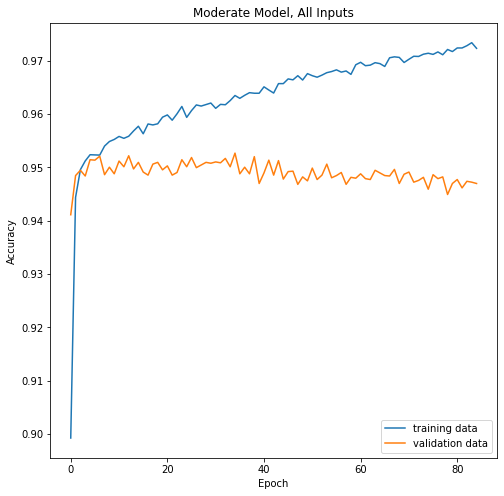

In [29]:
# Plot the learning curves (loss/accuracy/MAE)
plt.figure(figsize=(8,8))
plt.plot(historyMain2.history['accuracy']) # replace with accuracy/MAE
plt.plot(historyMain2.history['val_accuracy']) # replace with val_accuracy, etc.
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.title('Moderate Model, All Inputs')
plt.legend(['training data', 'validation data'], loc='lower right')
plt.savefig('MMAllIn.png')
plt.show()
files.download('MMAllIn.png')

In [43]:
predictionMain2Train = modelMain2.predict(XTRAIN)
predictionMain2 = modelMain2.predict(XVALID)
print("Training Accuracy: {:.2f}%".format(accuracy_score(YTRAIN, predictionMain2Train.round()) * 100))
print("Validation Accuracy: {:.2f}%".format(accuracy_score(YVALID, predictionMain2.round()) * 100))

Training Accuracy: 96.67%
Validation Accuracy: 95.27%


Slightly more complex model with the limited inputs.

In [45]:
callback_a_early3 = ModelCheckpoint(filepath = 'modelEarly3.hdf5', monitor = 'val_accuracy', save_best_only = True, save_weights_only = True, verbose = 1)
callback_b_early3 = EarlyStopping(monitor = 'val_accuracy', mode = 'max' , patience = 100, verbose = 1)

modelEarly3 = Sequential()
modelEarly3.add(Dense(200, input_dim = outColEarly, activation = 'relu'))
modelEarly3.add(Dense(1, activation='sigmoid'))
modelEarly3.compile(loss='binary_crossentropy', optimizer = 'rmsprop', metrics=['accuracy'])
historyEarly3 = modelEarly3.fit(XTRAINearly, YTRAINearly, validation_data=(XVALIDearly, YVALIDearly), epochs = 1000, verbose = 1, callbacks = [callback_a_early3, callback_b_early3])
modelEarly3.load_weights('modelEarly3.hdf5')

Epoch 1/1000
852/885 [===========================>..] - ETA: 0s - loss: 0.6225 - accuracy: 0.6514
Epoch 00001: val_accuracy improved from -inf to 0.64835, saving model to modelEarly3.hdf5
885/885 [==============================] - 2s 2ms/step - loss: 0.6219 - accuracy: 0.6514 - val_loss: 0.6207 - val_accuracy: 0.6484
Epoch 2/1000
849/885 [===========================>..] - ETA: 0s - loss: 0.6161 - accuracy: 0.6562
Epoch 00002: val_accuracy did not improve from 0.64835
885/885 [==============================] - 1s 2ms/step - loss: 0.6162 - accuracy: 0.6560 - val_loss: 0.6194 - val_accuracy: 0.6468
Epoch 3/1000
875/885 [============================>.] - ETA: 0s - loss: 0.6145 - accuracy: 0.6547
Epoch 00003: val_accuracy did not improve from 0.64835
885/885 [==============================] - 1s 2ms/step - loss: 0.6148 - accuracy: 0.6543 - val_loss: 0.6197 - val_accuracy: 0.6446
Epoch 4/1000
868/885 [============================>.] - ETA: 0s - loss: 0.6140 - accuracy: 0.6569
Epoch 00004: va

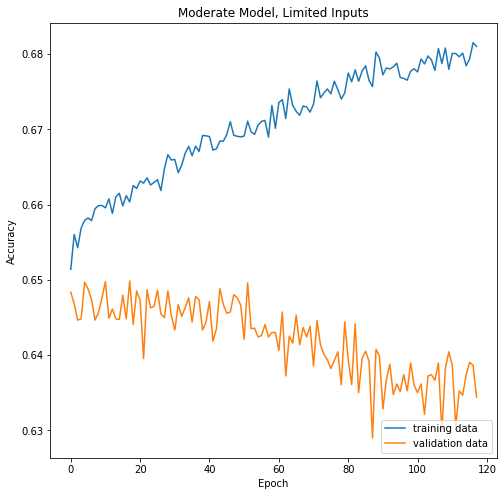

In [47]:
# Plot the learning curves (loss/accuracy/MAE)
plt.figure(figsize=(8,8))
plt.plot(historyEarly3.history['accuracy']) # replace with accuracy/MAE
plt.plot(historyEarly3.history['val_accuracy']) # replace with val_accuracy, etc.
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.title('Moderate Model, Limited Inputs')
plt.legend(['training data', 'validation data'], loc='lower right')
plt.savefig('MMLimIn.png')
plt.show()
files.download('MMLimIn.png')

In [48]:
predictionEarly3Train = modelEarly3.predict(XTRAINearly)
predictionEarly3 = modelEarly3.predict(XVALIDearly)
print("Training Accuracy: {:.2f}%".format(accuracy_score(YTRAINearly, predictionEarly3Train.round()) * 100))
print("Validation Accuracy: {:.2f}%".format(accuracy_score(YVALIDearly, predictionEarly3.round()) * 100))

Training Accuracy: 66.41%
Validation Accuracy: 64.98%


An attempt at using a complex model to predict without all inputs, ignoring those known only after a match ends.

In [0]:
callback_a_early2 = ModelCheckpoint(filepath = 'modelEarly2.hdf5', monitor = 'val_accuracy', save_best_only = True, save_weights_only = True, verbose = 1)
callback_b_early2 = EarlyStopping(monitor = 'val_accuracy', mode = 'max' , patience = 100, verbose = 1)

modelEarly2 = Sequential()
modelEarly2.add(Dense(5000, input_dim = outColEarly, activation = 'relu'))
modelEarly2.add(Dense(1000, activation = 'relu'))
modelEarly2.add(Dense(100, activation = 'relu'))
modelEarly2.add(Dense(1, activation='sigmoid'))
modelEarly2.compile(loss='binary_crossentropy', optimizer = 'rmsprop', metrics=['accuracy'])
historyEarly2 = modelEarly2.fit(XTRAINearly, YTRAINearly, validation_data=(XVALIDearly, YVALIDearly), epochs = 1000, verbose = 1, callbacks = [callback_a_early2, callback_b_early2])
modelEarly2.load_weights('modelEarly2.hdf5')

Epoch 1/1000
885/885 [==============================] - ETA: 0s - loss: 0.6285 - accuracy: 0.6455
Epoch 00001: val_accuracy improved from -inf to 0.64786, saving model to modelEarly2.hdf5
885/885 [==============================] - 61s 69ms/step - loss: 0.6285 - accuracy: 0.6455 - val_loss: 0.6253 - val_accuracy: 0.6479
Epoch 2/1000
885/885 [==============================] - ETA: 0s - loss: 0.6193 - accuracy: 0.6556
Epoch 00003: val_accuracy improved from 0.64786 to 0.64934, saving model to modelEarly2.hdf5
885/885 [==============================] - 60s 67ms/step - loss: 0.6193 - accuracy: 0.6556 - val_loss: 0.6200 - val_accuracy: 0.6493
Epoch 4/1000
885/885 [==============================] - ETA: 0s - loss: 0.6180 - accuracy: 0.6562
Epoch 00004: val_accuracy did not improve from 0.64934
885/885 [==============================] - 60s 68ms/step - loss: 0.6180 - accuracy: 0.6562 - val_loss: 0.6239 - val_accuracy: 0.6488
Epoch 5/1000
885/885 [==============================] - ETA: 0s - los

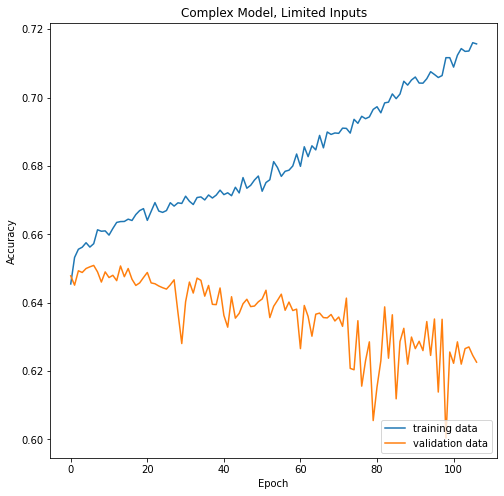

In [0]:
# Plot the learning curves (loss/accuracy/MAE)
plt.figure(figsize=(8,8))
plt.plot(historyEarly2.history['accuracy']) # replace with accuracy/MAE
plt.plot(historyEarly2.history['val_accuracy']) # replace with val_accuracy, etc.
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.title('Complex Model, Limited Inputs')
plt.legend(['training data', 'validation data'], loc='lower right')
plt.savefig('CMLimIn.png')
plt.show()
files.download('CMLimIn.png')

In [0]:
predictionEarly2Train = modelEarly2.predict(XTRAINearly)
predictionEarly2 = modelEarly2.predict(XVALIDearly)
print("Training Accuracy: {}".format(accuracy_score(YTRAIN, predictionEarly2Train.round()))
print("Validation Accuracy: {}".format(accuracy_score(YVALID, predictionEarly2.round()))